# **Machine Learning Approache**

Once the feature vectors have been extracted from the CSV, we can proceed with the machine learning approach. In this notebook, we will follow the standard machine learning process, including:

- Data Preprocessing: Cleaning and preparing the data for analysis.
- Feature Selection: Choosing the most relevant features for the model.
- Model Selection: Selecting an appropriate machine learning algorithm.
- Model Training: Training the chosen model on the training data.
- Model Evaluation: Assessing the performance of the model using evaluation metrics.
- Hyperparameter Tuning: Optimizing the model parameters for better performance.
- Model Deployment: Deploying the trained model for making predictions on new data.


## Import Libraries

In [5]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder 
from imblearn.over_sampling import SMOTE ,BorderlineSMOTE, SVMSMOTE, SMOTENC,ADASYN
from sklearn.model_selection import train_test_split,cross_validate
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression,RidgeClassifier, SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel,SelectKBest, f_classif
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis, LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from imblearn.over_sampling import SMOTE ,BorderlineSMOTE, SVMSMOTE, SMOTENC,ADASYN
from imblearn.under_sampling import RandomUnderSampler
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, f1_score ,matthews_corrcoef
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from sklearn.metrics import average_precision_score
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.svm import SVC 
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC 
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report ,ConfusionMatrixDisplay
from scipy import stats

## Load Data

In [6]:
def load_dataset(filepath):
    """
    Load the dataset from a CSV file and map the 'LABEL' column to binary values.
    
    Args:
    - filepath (str): The path to the CSV file containing the dataset.

    Returns:
    - pd.DataFrame: The loaded dataset with mapped labels.
    """
    dataset = pd.read_csv(filepath)
    dataset['LABEL'] = dataset['LABEL'].map({'REAL': 1, 'FAKE': 0})
    return dataset

# Usage example
dataset=load_dataset('classic_dataset.csv')
dataset

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,original_sample,LABEL
0,0.406386,2.330448e-06,1726.655699,1313.557843,2691.572473,0.166597,-1100.7067,24.243960,-4.094224,-11.856074,...,-0.645584,-1.132566,-2.796956,-3.261251,-0.838425,0.040199,-0.060215,-1.380227,biden-to-linus,0
1,0.488610,1.630488e-06,1494.088560,1153.547713,2407.247340,0.133025,-1096.9489,24.468382,-14.611142,-24.319674,...,-4.825761,-5.560062,-2.493378,0.818925,1.947905,2.038474,0.929851,-0.998066,biden-to-linus,0
2,0.362645,3.494181e-06,1782.177518,1487.270741,3031.000665,0.133561,-1091.5085,32.404736,6.421550,0.285010,...,-2.619793,-1.499528,-1.358110,-2.547226,-2.780263,-4.007583,-1.956640,-2.554284,biden-to-linus,0
3,0.504109,1.449966e-06,1674.299640,1243.949639,2822.639628,0.154214,-1096.3325,22.426727,-19.766582,-29.948235,...,-6.615138,-6.136604,-0.366887,2.285073,2.371751,1.384992,0.033304,1.461536,biden-to-linus,0
4,0.350328,2.722042e-06,1806.168628,1466.968719,3179.770612,0.151310,-1098.4689,25.183228,2.385233,-2.528898,...,-4.927695,-4.255420,-3.070653,-1.945070,-1.668662,-3.040927,-2.284341,-1.515240,biden-to-linus,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9971,0.316170,1.284757e-06,1682.845217,1652.609098,3072.639628,0.111993,-1114.6527,15.194299,4.524409,3.563511,...,-0.320019,-0.010580,-1.126601,-1.196117,-0.631510,-0.997464,-1.297959,-0.855159,trump-original,1
9972,0.390607,7.107834e-07,1616.014539,1708.714104,3233.460771,0.111874,-1121.9220,10.930627,6.196433,2.819153,...,-0.427091,-0.014760,-0.732595,-1.226603,-0.793108,-0.386619,-0.622035,-0.927777,trump-original,1
9973,0.365970,1.233685e-06,2452.892084,1866.356939,4280.751330,0.226599,-1118.0184,13.119451,9.031300,4.715108,...,-1.801935,-0.429014,-0.371208,-0.587302,-0.158402,-0.792657,-0.824357,-0.328380,trump-original,1
9974,0.341479,1.393258e-06,1980.140163,1735.292494,3500.664894,0.148453,-1112.7692,16.963621,4.313049,2.521054,...,-0.666117,0.704803,-0.250046,-1.549501,-1.564756,-1.418983,-1.488376,-1.166654,trump-original,1


### **Important Info:**

**Problem Type:**

Classification (Binary)
Problem:<br>

**Goal:**

Build a machine learning model to predict if a segment is 'REAL' or 'FAKE'.<br>
These details (features we will use to predict), will let us determine the target variable which is:<br>
Target (1=REAL , 0=FAKE)

## Take a peek at the data 

In [7]:
def peek_at_data(dataset):
    """
    Print and display various characteristics of the dataset, including shape, data types,
    missing values, statistical properties, class distribution, and duplicate values.

    Args:
    - dataset (pd.DataFrame): The dataset to be analyzed.

    Returns:
    - None
    """
    print("Our dataset has the following attributes:")
    print(dataset.keys().tolist())
    
    print("\nThe dataset has a shape of {}.".format(dataset.shape))
    
    print("\nThe data types of the dataset columns are:\n")
    display(dataset.info())
    
    print("\nNext, let's check if there are any missing values:")
    display(dataset.isnull().sum())
    
    print("\nStatistical properties of the dataset:")
    display(dataset.describe())
    print('With the describe function, we can find 8 basic statistical properties for each attribute:')
    print('- Count: Number of values for each attribute')
    print('- Mean: Mean of all values of the attribute')
    print('- Standard Deviation: Variation of values. Low means values are closer to the mean')
    print('- Minimum value')
    print('- 25th Percentile: Value under which 25% of the instances can be found')
    print('- 50th Percentile (Median): Value that splits the distribution in half')
    print('- 75th Percentile: Value under which 75% of the instances can be found')
    print('- Maximum value')
    
    print("\nNow, let's check our class distribution:")
    print("On classification problems, it is important to know how balanced the class values are.")
    print("From the figure below, it is evident that there is a problem of imbalanced data, even before dropping any duplicate values.")
    print("We will check again after data cleaning.\n")
    
    distribution = dataset['LABEL'].value_counts()
    print(distribution)
    
    fig = px.bar(distribution, 
                 x=distribution.index, 
                 y=distribution.values, 
                 labels={'x': 'Label', 'y': 'Count'}, 
                 title='Distribution of Labels in the Dataset', 
                 color=distribution.index, 
                 color_continuous_scale=['red', 'green'])

    fig.update_layout(xaxis_title='Label', yaxis_title='Count', xaxis=dict(tickmode='array', tickvals=[0, 1], ticktext=['FAKE', 'REAL']))
    fig.show()
    
    print("\nNext, let's check if there are any duplicate values:")
    duplicates = dataset.duplicated().sum()
    display(duplicates)
    
    if duplicates == 0:
        print("We don't have duplicate values.")
    else:
        print(f"We have {duplicates} duplicate values.")

# Usage example
dataset = load_dataset('classic_dataset.csv')
peek_at_data(dataset)

Our dataset has the following attributes:
['chroma_stft', 'rms', 'spectral_centroid', 'spectral_bandwidth', 'rolloff', 'zero_crossing_rate', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7', 'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc14', 'mfcc15', 'mfcc16', 'mfcc17', 'mfcc18', 'mfcc19', 'mfcc20', 'original_sample', 'LABEL']

The dataset has a shape of (9976, 28).

The data types of the dataset columns are:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9976 entries, 0 to 9975
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   chroma_stft         9976 non-null   float64
 1   rms                 9976 non-null   float64
 2   spectral_centroid   9976 non-null   float64
 3   spectral_bandwidth  9976 non-null   float64
 4   rolloff             9976 non-null   float64
 5   zero_crossing_rate  9976 non-null   float64
 6   mfcc1               9976 non-null   float64
 7   mf

None


Next, let's check if there are any missing values:


chroma_stft           0
rms                   0
spectral_centroid     0
spectral_bandwidth    0
rolloff               0
zero_crossing_rate    0
mfcc1                 0
mfcc2                 0
mfcc3                 0
mfcc4                 0
mfcc5                 0
mfcc6                 0
mfcc7                 0
mfcc8                 0
mfcc9                 0
mfcc10                0
mfcc11                0
mfcc12                0
mfcc13                0
mfcc14                0
mfcc15                0
mfcc16                0
mfcc17                0
mfcc18                0
mfcc19                0
mfcc20                0
original_sample       0
LABEL                 0
dtype: int64


Statistical properties of the dataset:


,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,LABEL
count,9976.000000,9.976000e+03,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,...,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000
mean,0.384844,1.491000e-06,1894.903181,1624.704051,3477.803527,0.151162,-1113.849583,15.417833,4.759902,0.810058,...,-1.020496,-1.121106,-1.146588,-1.594220,-1.529452,-1.292672,-1.394015,-1.350726,-1.245700,0.125000
std,0.068103,8.847950e-07,408.555019,211.526995,716.888032,0.048400,9.866635,8.574750,5.411856,5.301319,...,1.524791,1.636187,1.845005,1.818831,1.386676,1.337262,1.539159,1.482231,1.566922,0.330735
min,0.192016,1.885218e-08,751.075078,814.031138,1175.033245,0.047789,-1131.370700,-0.045592,-35.987545,-35.428635,...,-8.396559,-9.469828,-11.136946,-11.085521,-8.096085,-8.258033,-9.566962,-11.160834,-10.241286,0.000000
25%,0.338620,8.038196e-07,1618.971167,1493.354487,2985.600898,0.116121,-1121.666675,9.018720,1.473057,-0.684326,...,-1.957222,-1.988533,-1.940925,-2.333962,-2.365771,-1.994072,-2.191322,-2.179187,-2.110077,0.000000
50%,0.379322,1.395199e-06,1832.219386,1626.345767,3393.658577,0.144474,-1113.674950,15.327886,4.579738,1.225916,...,-0.887676,-0.874468,-0.849411,-1.260694,-1.352426,-1.167684,-1.206524,-1.202708,-1.123163,0.000000
75%,0.423453,2.051473e-06,2139.004335,1756.738060,3913.085938,0.178469,-1106.962775,21.148269,8.360008,3.795721,...,-0.024140,-0.027661,0.000000,-0.399627,-0.536800,-0.390419,-0.393258,-0.433285,-0.392261,0.000000
max,0.717675,5.631835e-06,3436.430193,2319.027479,5937.666223,0.350903,-1077.104900,53.450413,23.267744,15.245434,...,5.784697,3.601582,5.344064,4.406496,3.278367,3.995316,5.590662,8.477674,9.990973,1.000000


With the describe function, we can find 8 basic statistical properties for each attribute:
- Count: Number of values for each attribute
- Mean: Mean of all values of the attribute
- Standard Deviation: Variation of values. Low means values are closer to the mean
- Minimum value
- 25th Percentile: Value under which 25% of the instances can be found
- 50th Percentile (Median): Value that splits the distribution in half
- 75th Percentile: Value under which 75% of the instances can be found
- Maximum value

Now, let's check our class distribution:
On classification problems, it is important to know how balanced the class values are.
From the figure below, it is evident that there is a problem of imbalanced data, even before dropping any duplicate values.
We will check again after data cleaning.

LABEL
0    8729
1    1247
Name: count, dtype: int64



Next, let's check if there are any duplicate values:


0

We don't have duplicate values.


## Exploratory Data Analysis (EDA)

In [8]:
y = dataset['LABEL']
X = dataset.drop(['LABEL','original_sample'], axis = 1) 

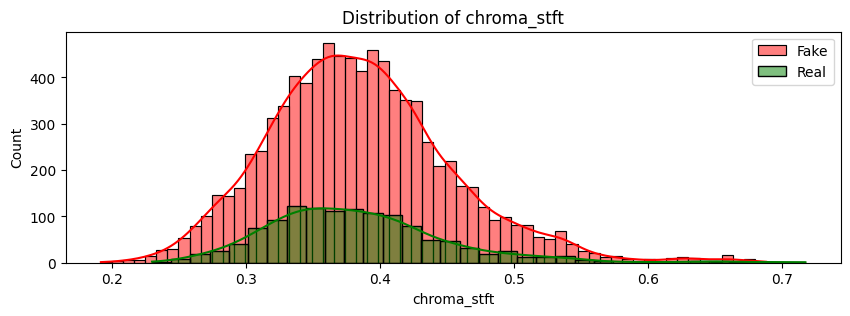

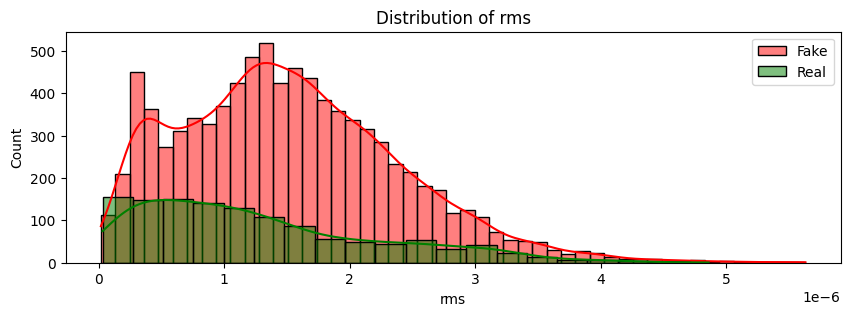

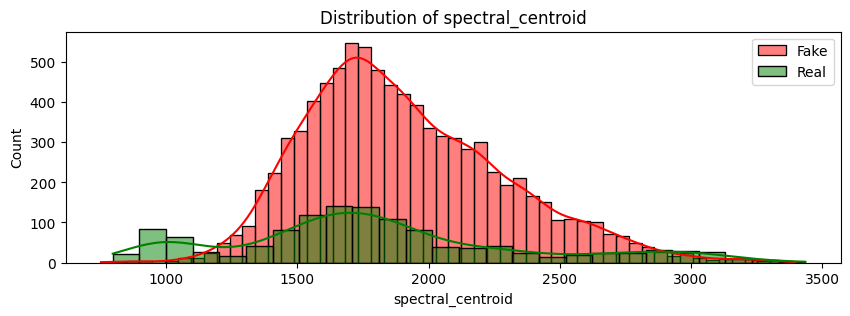

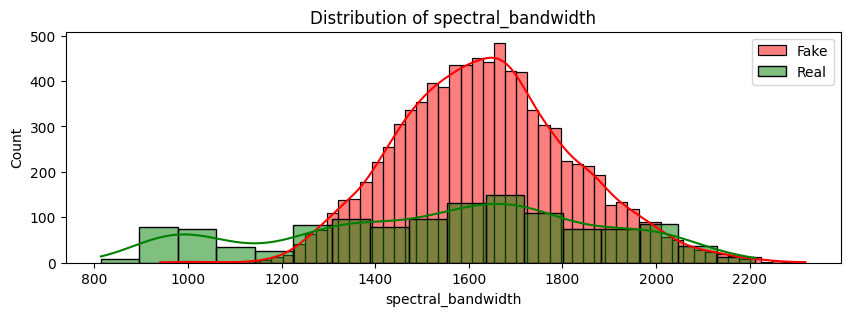

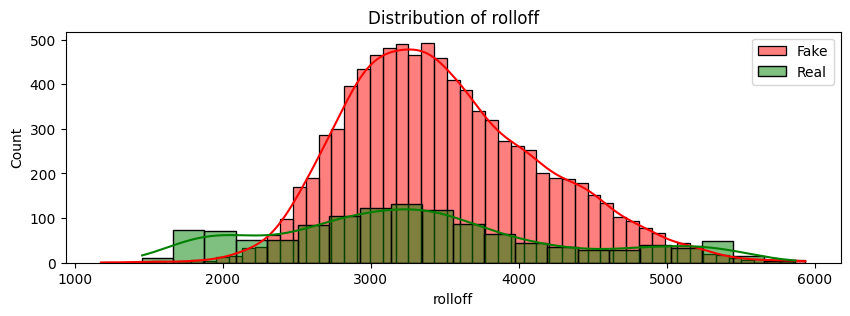

...

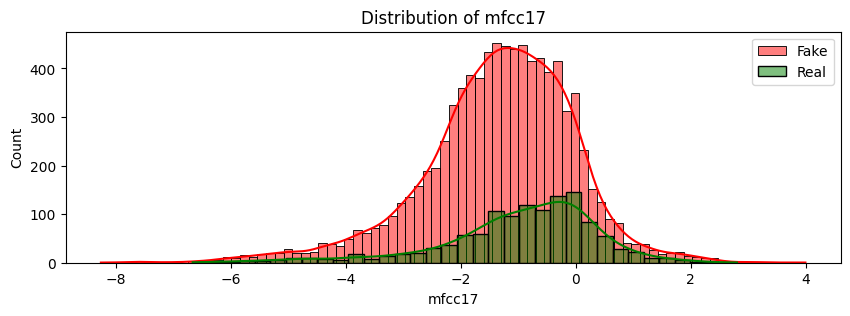

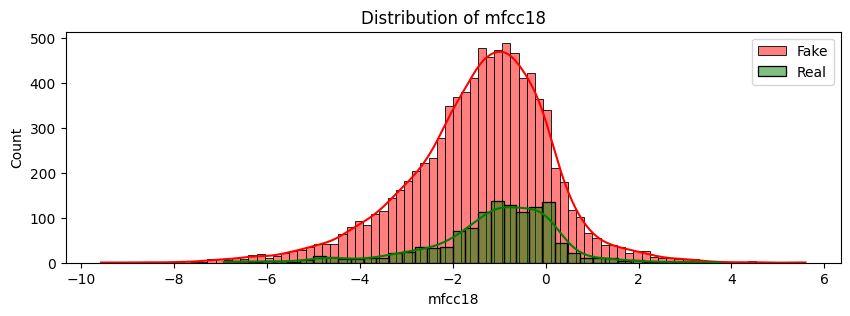

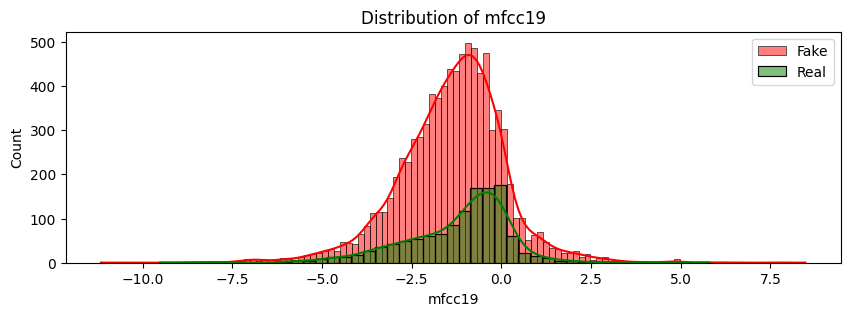

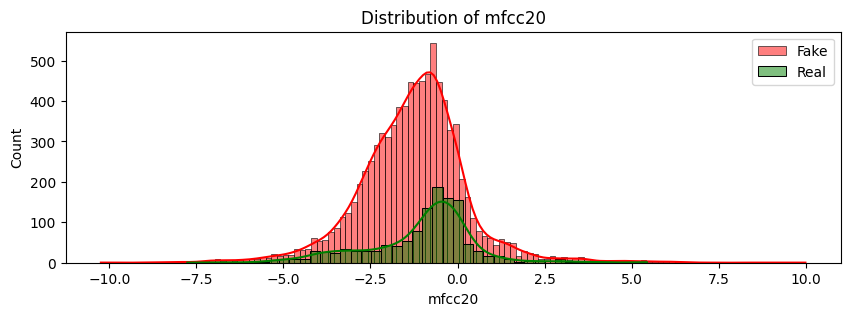

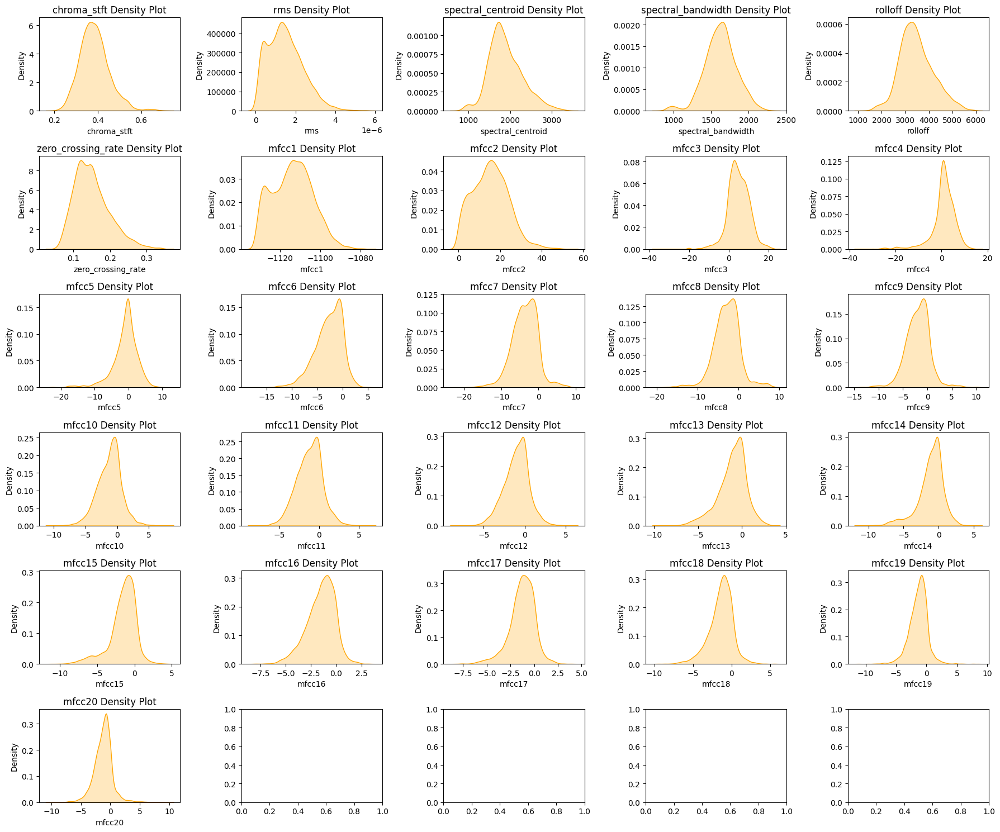

In [9]:
def exploratory_data_analysis(dataset):
    """
    Perform exploratory data analysis (EDA) on the dataset, including visualizations of
    feature distributions, correlation heatmap, and box-and-whisker plots.

    Args:
    - dataset (pd.DataFrame): The dataset to be analyzed.

    Returns:
    - None
    """
    # Separate features and target
    y = dataset['LABEL']
    X = dataset.drop(['LABEL', 'original_sample'], axis=1)

    # Suppress future warnings from seaborn
    warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

    # Distribution plots for each feature
    for column in X:
        plt.figure(figsize=(10, 3))
        sns.histplot(dataset[dataset['LABEL'] == 0][column], kde=True, label='Fake', color='red')
        sns.histplot(dataset[dataset['LABEL'] == 1][column], kde=True, label='Real', color='green')
        plt.title(f'Distribution of {column}')
        plt.legend()
        plt.show()

    # Drop 'original_sample' for correlation analysis
    dataset_without_origin = dataset.drop('original_sample', axis=1)
    correlation_matrix = dataset_without_origin.corr()

    # Correlation heatmap
    fig = go.Figure(data=go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.index,
        colorscale='RdYlGn',
    ))

    fig.update_layout(
        title='Correlation Matrix - Heatmap',
        xaxis_title='Features',
        yaxis_title='Features',
        width=800,
        height=700,
    )

    # Show correlation heatmap
    fig.show()

    # Box-and-whisker plots for each feature
    fig = go.Figure()

    for i, feature in enumerate(dataset_without_origin.columns[:-1]):
        box_trace = go.Box(
            x=dataset_without_origin['LABEL'],
            y=dataset_without_origin[feature],
            name=feature,
            marker=dict(color='red'),
        )

        fig.add_trace(box_trace)

    fig.update_layout(
        title='Box-and-Whisker Plots for Selected Features',
        xaxis=dict(title='LABEL'),
        yaxis=dict(title='Feature Value'),
        height=800,
        width=1200,
    )

    # Show box-and-whisker plots
    fig.show()

    # KDE plots for each feature
    fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(18, 15))
    axes = axes.flatten()
    for i, w in enumerate(dataset_without_origin.columns[:-1]):
        sns.kdeplot(data=dataset_without_origin, x=w, fill=True, color='orange', ax=axes[i])
        axes[i].set_title(f'{w} Density Plot')
        axes[i].set_xlabel(w)
        axes[i].set_ylabel('Density')
    plt.tight_layout()
    plt.show()

# Usage example
dataset = pd.read_csv('classic_dataset.csv')
dataset['LABEL'] = dataset['LABEL'].map({'REAL': 1, 'FAKE': 0})

exploratory_data_analysis(dataset)

**OBSERVATIONS:**

1. Strong Positive Correlations:

- Chroma_stft has strong positive correlations with zero_crossing_rate (0.341), rolloff (0.298), and spectral_centroid (0.271).
- RMS has strong positive correlations with mfcc1 (0.905), mfcc2 (0.821), and mfcc3 (0.256).
- Zero_crossing_rate has strong positive correlations with spectral_centroid (0.931) and rolloff (0.839).

2. Strong Negative Correlations:

- Chroma_stft has a strong negative correlation with rms (-0.468).
- RMS has strong negative correlations with rolloff (-0.321) and spectral_bandwidth (-0.315).
- Spectral_bandwidth has a strong negative correlation with spectral_centroid (-0.286).

3. Medium Correlations:

- Several MFCCs have moderate to strong positive correlations with each other, indicating some level of redundancy or shared information.
- MFCCs tend to have positive correlations with RMS and Zero_crossing_rate.

4. Label Correlations:

- The LABEL column (presumably representing classes or categories) shows relatively weak correlations with most features, suggesting they may not be strongly predictive on their own.

5. Highly Correlated Features:

- There are several pairs of features with high positive correlations, indicating redundancy. For example, mfcc1 and mfcc2 have a correlation coefficient of 0.931.

6. Feature Importance:

- Features such as mfcc1, mfcc2, and rolloff seem to be important indicators, given their strong correlations with other features.


These observations can provide insights into feature relationships and potentially guide feature selection or dimensionality reduction techniques in further analysis or modeling.






## Split into Train and Test

In [363]:
def train_test_split_dataset(dataset, testing_samples, val_size=0.1, random_state=42):
    """Splits a DataFrame into training, validation, and testing sets in a stratified way.
    Args:
        dataset_cleaned (pd.DataFrame): DataFrame to split.
        testing_samples (list): List of samples to keep for testing.
        val_size (float): Proportion of the dataset to include in the validation split.
        random_state (int): Random seed for reproducibility.
    Returns:
        pd.DataFrame: Training set.
        pd.DataFrame: Validation set.
        pd.DataFrame: Testing set.
    """
    # Separate out the original samples for testing
    origin_sample = dataset['original_sample'].unique()
    original_test_samples = [i + "-original" for i in testing_samples]
    potential_fake_test_samples = [i + "-to" for i in testing_samples]
    
    # Keep the original samples in the test set that contain the strings from the potential_fake_test_samples
    fake_test_samples = [i for i in origin_sample if any(j in i for j in potential_fake_test_samples)]
    test_df = dataset[dataset["original_sample"].isin(original_test_samples + fake_test_samples)]
    
    # Remove the test samples from the dataset
    dataset = dataset[~dataset["original_sample"].isin(original_test_samples + fake_test_samples)]
    
    # Normalize the features
    scaler = StandardScaler()
    dataset.iloc[:, :-2] = scaler.fit_transform(dataset.iloc[:, :-2])
    
    # Split off the train and val set
    train_df, val_df = train_test_split(dataset, test_size=val_size, stratify=dataset['LABEL'], random_state=random_state)
    
    # Normalize the test set
    test_df.iloc[:, :-2] = scaler.transform(test_df.iloc[:, :-2])
    
    return train_df.reset_index(drop=True), val_df.reset_index(drop=True), test_df.reset_index(drop=True)

# Assuming dataset_cleaned is already loaded
testing_samples = ["ryan", "margot"]

# Split the dataset
train_df, val_df, test_df = train_test_split_dataset(dataset, testing_samples)

# Check sizes of the datasets
print(f"Original dataset size: {dataset.shape[0]}")
print(f"Training set size: {train_df.shape[0]}")
print(f"Validation set size: {val_df.shape[0]}")
print(f"Test set size: {test_df.shape[0]}")

# Further split train_df into X_train, y_train, X_val, y_val, X_test, y_test
X_train = train_df.drop(columns=['original_sample', 'LABEL'])
y_train = train_df['LABEL']
X_val = val_df.drop(columns=['original_sample', 'LABEL'])
y_val = val_df['LABEL']
X_test = test_df.drop(columns=['original_sample', 'LABEL'])
y_test = test_df['LABEL']

# Create DataFrames for y_train and y_test
df_train = pd.DataFrame({'target': y_train, 'dataset': 'Train'})
df_test = pd.DataFrame({'target': y_test, 'dataset': 'Test'})
df_combined = pd.concat([df_train, df_test])

# Plot distributions using Plotly Express
fig = px.histogram(df_combined, x='target', color='dataset', barmode='group', category_orders={'target': [0, 1]},
                   labels={'target': 'Target', 'dataset': 'Dataset'},
                   title='Distribution of Target in Train and Test Sets')
fig.update_layout(width=1000)
fig.show()

Original dataset size: 9976
Training set size: 8568
Validation set size: 952
Test set size: 456


## Data Cleaning 

- We have already done the first step of cleaning which is :  **Encoding categorical features**

  In that case the only categorical feature was the 'LABEL' . We replace 'FAKE' with 0 and 'REAL' with 1

- As we saw earlier , we don't have **missing values** or **duplicates**


**Normalization** 

Normalization ensures that all features contribute equally to the creation of synthetic samples.
This ensures that all features contribute equally to the machine learning algorithm, preventing features with larger scales from dominating the learning process. This is especially important for algorithms like SVM, KNN, and neural networks, which are sensitive to the scale of input data.

In [436]:
scaler =MinMaxScaler()
X_scaled_df = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_scaled = pd.DataFrame(X_scaled_df, columns=X_train.columns)
X_scaled

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
0,0.886729,0.082054,0.902144,0.872089,0.957926,0.947523,0.032912,0.018757,0.516767,0.669303,...,0.553435,0.560078,0.713602,0.683529,0.741721,0.714806,0.647674,0.607768,0.580577,0.558462
1,0.335160,0.390325,0.335252,0.517792,0.392625,0.224578,0.674185,0.594702,0.698055,0.758386,...,0.648789,0.644700,0.860872,0.836589,0.648133,0.474695,0.566367,0.499270,0.524683,0.585512
2,0.431901,0.171503,0.352405,0.705021,0.529422,0.090057,0.243286,0.257926,0.708086,0.860996,...,0.672304,0.710375,0.897640,0.784883,0.805329,0.835904,0.795479,0.714897,0.598780,0.557859
3,0.224423,0.105759,0.477630,0.823315,0.664753,0.254126,0.140584,0.170562,0.655645,0.751261,...,0.640086,0.616172,0.691373,0.609234,0.663126,0.713195,0.739137,0.714629,0.632370,0.597583
4,0.276055,0.250643,0.259230,0.314368,0.291934,0.221259,0.300832,0.212086,0.494111,0.647720,...,0.467534,0.532468,0.721506,0.681247,0.678465,0.643723,0.703536,0.595109,0.464603,0.458889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8563,0.168671,0.583997,0.434318,0.526359,0.473143,0.337158,0.603548,0.375185,0.428314,0.631927,...,0.668957,0.860027,0.652970,0.672026,0.645136,0.324797,0.452150,0.235918,0.217068,0.423097
8564,0.344758,0.222753,0.245252,0.439963,0.309577,0.174801,0.245987,0.241250,0.598701,0.641352,...,0.531531,0.451595,0.538751,0.572115,0.674267,0.696714,0.676659,0.621106,0.540312,0.510076
8565,0.263305,0.466172,0.459225,0.552368,0.501780,0.446649,0.499208,0.454652,0.674934,0.765214,...,0.294004,0.388737,0.563635,0.599508,0.568701,0.403422,0.511736,0.527664,0.435431,0.383805
8566,0.366873,0.208562,0.242069,0.435841,0.356328,0.080667,0.321681,0.351073,0.739272,0.800980,...,0.645964,0.716333,0.886005,0.804590,0.862449,0.824584,0.725588,0.663462,0.533876,0.505530


**BOX PLOT AFTER NORMILIZATION**

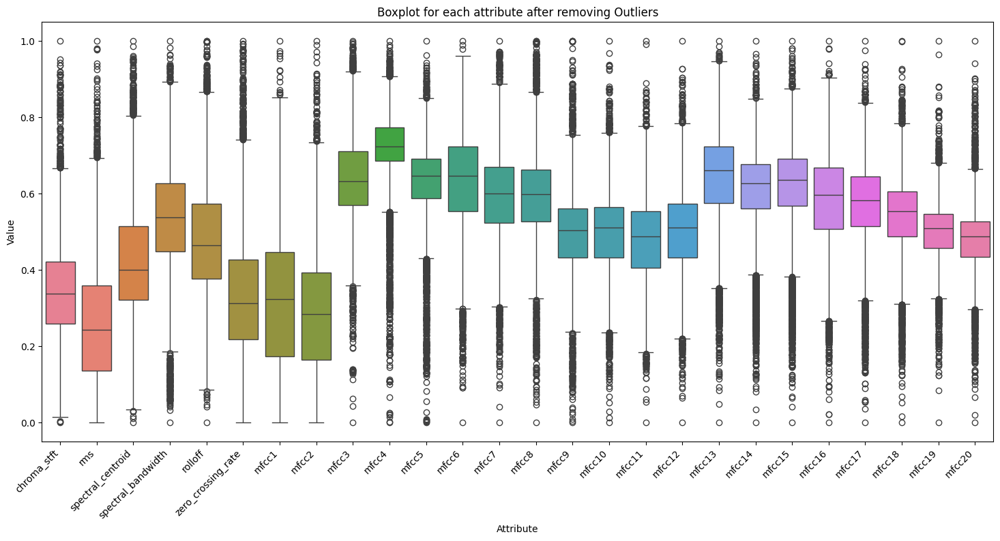

In [438]:
f = plt.figure(figsize=(18,8))
sns.boxplot(data=X_scaled)
plt.title('Boxplot for each attribute after removing Outliers')
plt.xlabel('Attribute')
plt.ylabel('Value')
plt.xticks(rotation=45, ha="right")
plt.show()

**BOX PLOT FOR EACH ATTRIBUTE BEFORE STANDARIZATION**

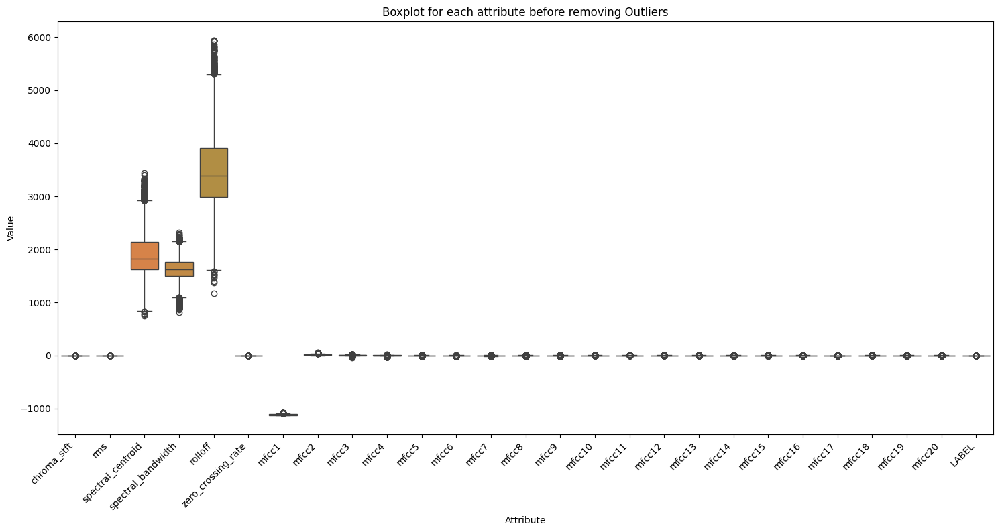

In [439]:
f = plt.figure(figsize=(18,8))
sns.boxplot(data=dataset_without_origin)
plt.title('Boxplot for each attribute before removing Outliers')
plt.xlabel('Attribute')
plt.ylabel('Value')
plt.xticks(rotation=45, ha="right")
plt.show()

## Feature Selection

This step can help improve the performance of your models by reducing overfitting and computational complexity.
After our evaluation, we concluded that feature selection does not enhance our model's performance.

**1. Remove the most correlated attributes**

Removing highly correlated features is beneficial because it reduces redundancy in the dataset, improves model stability and interpretability, enhances computational efficiency, and prevents issues like multicollinearity in regression models. This practice ensures that the model focuses on unique and informative predictors, leading to more accurate and reliable predictions.

In [440]:
correlation_matrix = X_scaled.corr().abs()
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.8)]
X_dr = X_scaled.drop(columns=to_drop)
print("Most correlated attributes:")
print(to_drop)
print("Dataset after removing most correlated attributes:")
X_dr.columns

Most correlated attributes:
['spectral_bandwidth', 'rolloff', 'zero_crossing_rate', 'mfcc1', 'mfcc2', 'mfcc4', 'mfcc5', 'mfcc8', 'mfcc9', 'mfcc14', 'mfcc15', 'mfcc18']
Dataset after removing most correlated attributes:


Index(['chroma_stft', 'rms', 'spectral_centroid', 'mfcc3', 'mfcc6', 'mfcc7',
       'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc16', 'mfcc17', 'mfcc19',
       'mfcc20'],
      dtype='object')

In [508]:
columns_list = ['chroma_stft', 'rms', 'spectral_centroid', 'spectral_bandwidth',
                'rolloff', 'zero_crossing_rate', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4',
                'mfcc5', 'mfcc6', 'mfcc7', 'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11',
                'mfcc12', 'mfcc13', 'mfcc14', 'mfcc15', 'mfcc16', 'mfcc17', 'mfcc18',
                'mfcc19', 'mfcc20']

# Convert to pandas DataFrame
daf= pd.DataFrame(X_test_scaled, columns=columns_list)
drop = ['spectral_bandwidth', 'rolloff', 'zero_crossing_rate', 'mfcc1', 'mfcc2', 'mfcc4', 'mfcc5', 'mfcc8', 'mfcc9', 'mfcc14', 'mfcc15', 'mfcc18']
X_test_scaled_cor=daf.drop(columns=drop)


**2. RFECV using Stratified k-fold and f1 scoring**

RFECV using Stratified k-fold and F1 scoring is a robust technique for binary classification because it addresses feature selection, cross-validation, and metric optimization specifically suited for this task. It helps in building more accurate and interpretable models by focusing on the most discriminative features while ensuring reliable performance evaluation through cross-validation and the F1 score.

In [442]:

rf_classifier = RandomForestClassifier(random_state=42)

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

rfecv = RFECV(estimator=rf_classifier, step=1, cv=stratified_kfold, scoring=make_scorer(f1_score))

rfecv.fit(X_scaled, y_train)

selected_features_mask = rfecv.support_
selected_features_indices = [i for i, selected in enumerate(selected_features_mask) if selected]
selected_features_names = X_scaled.columns[selected_features_indices]

print("Selected Features with F1 scoring:", selected_features_indices)
print("Selected Feature Names:", selected_features_names)



Selected Features with F1 scoring: [0, 1, 2, 3, 4, 6, 7, 8, 12, 13, 21]
Selected Feature Names: Index(['chroma_stft', 'rms', 'spectral_centroid', 'spectral_bandwidth',
       'rolloff', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc7', 'mfcc8', 'mfcc16'],
      dtype='object')


## Handling Class Imbalance

When working on a dataset with class imbalance problem, one needs to oversample or undersample only the train set and not the test set.

**OVERSAMPLING**

#### SMOTE 
Synthetic minority oversampling technique, also termed as SMOTE, is a clever way to perform over-sampling over the minority class to avoid overfitting(unlike random over-sampling that has overfitting problems). In SMOTE, a subset of minority class is taken and new synthetic data points are generated based on it. <br>
To avoid perfectly balanced classes and ensure a slight difference in the class counts we set a 90% of the minority class to be oversampled.

In [444]:
smote = SMOTE(sampling_strategy=0.9, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y_train)
X_resampled = pd.DataFrame(X_resampled, columns = X.columns)
display(X_resampled.head(3))
print("Training Set Class Balance before:{}".format(y.value_counts()))
print("Training Set Class Balance now:{}".format(y_resampled.value_counts()))

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
0,0.886729,0.082054,0.902144,0.872089,0.957926,0.947523,0.032912,0.018757,0.516767,0.669303,...,0.553435,0.560078,0.713602,0.683529,0.741721,0.714806,0.647674,0.607768,0.580577,0.558462
1,0.335160,0.390325,0.335252,0.517792,0.392625,0.224578,0.674185,0.594702,0.698055,0.758386,...,0.648789,0.644700,0.860872,0.836589,0.648133,0.474695,0.566367,0.499270,0.524683,0.585512
2,0.431901,0.171503,0.352405,0.705021,0.529422,0.090057,0.243286,0.257926,0.708086,0.860996,...,0.672304,0.710375,0.897640,0.784883,0.805329,0.835904,0.795479,0.714897,0.598780,0.557859


Training Set Class Balance before:LABEL
0    8729
1    1247
Name: count, dtype: int64
Training Set Class Balance now:LABEL
0    7497
1    6747
Name: count, dtype: int64


**UNDERSAMPLING**

In [445]:
undersampler = RandomUnderSampler(sampling_strategy=0.9, random_state=42)
X_undersampled, y_underesampled = undersampler.fit_resample(X_scaled, y_train)
X_undersampled = pd.DataFrame(X_undersampled, columns = X.columns)
display(X_undersampled.head(3))
print("Training Set Class Balance before:{}".format(y.value_counts()))
print("Training Set Class Balance now:{}".format(y_underesampled.value_counts()))

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
7187,0.324173,0.380624,0.457811,0.571011,0.496283,0.351844,0.423849,0.332664,0.551072,0.670963,...,0.435659,0.399699,0.653728,0.695128,0.670523,0.620807,0.514023,0.453547,0.442410,0.380875
6215,0.665902,0.011369,0.701940,0.828140,0.794761,0.688154,0.004996,0.007591,0.547977,0.704303,...,0.549008,0.563077,0.717797,0.674141,0.717035,0.716543,0.679290,0.635022,0.570226,0.546714
7514,0.426149,0.180472,0.495514,0.624075,0.551253,0.292165,0.241275,0.204214,0.691480,0.802474,...,0.515891,0.652748,0.823914,0.792978,0.747696,0.685742,0.656376,0.538082,0.509556,0.467792


Training Set Class Balance before:LABEL
0    8729
1    1247
Name: count, dtype: int64
Training Set Class Balance now:LABEL
0    1190
1    1071
Name: count, dtype: int64


## Model Selection

**Algorithms and Metrics Report**

<u>Algorithms</u>: We are going to compare a set of algorithms

1. XGBoost: An efficient implementation of gradient boosted decision trees designed for speed and performance. It combines the predictions of several base learners to improve robustness.

2. Random Forests: An ensemble learning method that constructs multiple decision trees during training and outputs the mode of the classes for classification.Suitable for both classification and regression tasks. Performs well with a large number of features and can handle missing values.

3. Quadratic Discriminant Analysis (QDA): A classification technique that models the class-conditional density as a Gaussian distribution with a distinct covariance matrix for each class.

4. Linear Discriminant Analysis (LDA): Similar to QDA but assumes identical covariance matrices across classes. It finds a linear combination of features that best separates two or more classes.

5. Ridge Regression: A linear regression model with L2 regularization to prevent overfitting by penalizing large coefficients.

6. Gaussian Naive Bayes: A probabilistic classifier based on Bayes' Theorem, assuming Gaussian distribution for continuous features.

7. Bernoulli Naive Bayes: A variant of Naive Bayes for binary/boolean features, assuming each feature follows a Bernoulli distribution. Suitable for text classification problems with binary features.

8. K-Nearest Neighbors (KNN): A non-parametric method that classifies instances based on the majority vote of their nearest neighbors.

9. Support Vector Machines (SVM): A powerful classifier that finds the optimal hyperplane that best separates the classes in a high-dimensional space.
 Effective in high-dimensional spaces and for cases where the number of dimensions exceeds the number of samples.

10. Stochastic Gradient Descent (SGD): An optimization algorithm for large-scale linear classifiers, performing updates using a single or few training samples at each iteration.

11. Gaussian Process Classifier: A non-parametric, probabilistic classifier that predicts the distribution over possible functions, providing uncertainty measures for predictions.

<u>Metrics</u>

1. Accuracy: The ratio of correctly predicted instances to the total instances. Provides a straightforward measure of overall performance but can be misleading with imbalanced datasets.

2. Precision: The ratio of true positive predictions to the total predicted positives. Useful when the cost of false positives is high, as it measures the quality of positive predictions.

3. Recall: The ratio of true positive predictions to the total actual positives. Important when the cost of false negatives is high, as it measures the model's ability to capture all positive instances.

4. F1 Score: The harmonic mean of precision and recall. Balances the trade-off between precision and recall, useful for imbalanced classes.

5. Matthews Correlation Coefficient (MCC): A measure of the quality of binary classifications, considering all four confusion matrix categories (true positives, false positives, true negatives, false negatives). Provides a balanced measure even with imbalanced classes, useful for binary classification.

**Baseline (no oversampling / normalization or feature selection)**

In [383]:
models = [
    ('XGB', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ('RF', RandomForestClassifier()),
    ('QDA', QuadraticDiscriminantAnalysis()),
    ('LDA', LinearDiscriminantAnalysis()),
    ('Ridge', RidgeClassifier()),
    ('GNB', GaussianNB()),
    ('BNB', BernoulliNB()),
    ('KNN', KNeighborsClassifier()),
    ('SVC', SVC(probability=True)),
    ('SGD', SGDClassifier()),
    ('GP', GaussianProcessClassifier()),
    ('LR', LogisticRegression()),
]

# Evaluate each model
results = []
names = []

for name, model in models:
    # Use StratifiedKFold for cross-validation
    stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Use cross_val_score with the specified metrics
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'precision': make_scorer(precision_score, average='weighted'),
        'recall': make_scorer(recall_score, average='weighted'),
        'f1': make_scorer(f1_score, average='weighted'),
        'mcc': make_scorer(matthews_corrcoef)
    }

 # Evaluate the model using cross-validation
    cv_results = cross_validate(model, X_train, y_train, cv=stratified_kfold, scoring=scoring)

    result = {
        'Model': name,
        'Accuracy Mean': cv_results['test_accuracy'].mean(),
        'Accuracy Std': cv_results['test_accuracy'].std(),
        'Precision Mean': cv_results['test_precision'].mean(),
        'Precision Std': cv_results['test_precision'].std(),
        'Recall Mean': cv_results['test_recall'].mean(),
        'Recall Std': cv_results['test_recall'].std(),
        'F1 Score Mean': cv_results['test_f1'].mean(),
        'F1 Score Std': cv_results['test_f1'].std(),
        'MCC Mean': cv_results['test_mcc'].mean(),
        'MCC Std': cv_results['test_mcc'].std()
    }
    
    results.append(result)

# Display the results in a DataFrame
results_df = pd.DataFrame(results)
results_df

,Model,Accuracy Mean,Accuracy Std,Precision Mean,Precision Std,Recall Mean,Recall Std,F1 Score Mean,F1 Score Std,MCC Mean,MCC Std
0,XGB,0.956699,0.002034,0.956122,0.002060,0.956699,0.002034,0.953948,0.002460,0.788642,0.010596
1,RF,0.941993,0.001904,0.943706,0.002789,0.941993,0.001904,0.934902,0.002131,0.707929,0.011023
2,QDA,0.706466,0.009486,0.888713,0.004966,0.706466,0.009486,0.755720,0.007690,0.380483,0.016288
3,LDA,0.895425,0.002808,0.882687,0.005803,0.895425,0.002808,0.871435,0.003456,0.390588,0.022148
4,Ridge,0.895891,0.002859,0.905092,0.004235,0.895891,0.002859,0.862006,0.005179,0.384886,0.028020
5,GNB,0.815358,0.010043,0.849390,0.003293,0.815358,0.010043,0.829553,0.007167,0.303719,0.015162
6,BNB,0.696895,0.008413,0.805640,0.004896,0.696895,0.008413,0.739719,0.006642,0.099274,0.019061
7,KNN,0.948412,0.004223,0.947273,0.004405,0.948412,0.004223,0.944311,0.005054,0.743662,0.023032
8,SVC,0.944911,0.002998,0.947147,0.002737,0.944911,0.002998,0.938312,0.003878,0.724544,0.016979
9,SGD,0.891340,0.003664,0.880197,0.006222,0.891340,0.003664,0.862133,0.011493,0.348522,0.050718


In [384]:
fig = go.Figure()

# Add a trace for each metric
for metric in ['Accuracy Mean', 'Precision Mean', 'Recall Mean', 'F1 Score Mean', 'MCC Mean']:
    fig.add_trace(go.Scatter(
        x=results_df['Model'],
        y=results_df[metric],
        mode='lines+markers',
        name=metric
    ))

# Customize the layout
fig.update_layout(
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis_title='Mean Score',
    legend_title='Metric',
    xaxis=dict(tickmode='array', tickvals=results_df['Model']),
    template='plotly_white'
)

# Show the plot
fig.show()

XGBoost (XGB) emerges as the top performer with the highest accuracy (0.9567) and strong performance across all other metrics, indicating its robust predictive capability. Random Forest (RF) follows closely, also showing high accuracy and overall balanced metrics. Models like Quadratic Discriminant Analysis (QDA) and Bernoulli Naive Bayes (BNB) display significantly lower performance, particularly in accuracy and MCC, suggesting they may not be well-suited for this dataset. Linear Discriminant Analysis (LDA) and Ridge Regression (Ridge) show moderate performance, while models like k-Nearest Neighbors (KNN) and Support Vector Classifier (SVC) also perform well but slightly below the top performers

**With Oversampling**

In [570]:
models = [
    ('XGB', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ('RF', RandomForestClassifier()),
    ('QDA', QuadraticDiscriminantAnalysis()),
    ('LDA', LinearDiscriminantAnalysis()),
    ('Ridge', RidgeClassifier()),
    ('GNB', GaussianNB()),
    ('BNB', BernoulliNB()),
    ('KNN', KNeighborsClassifier()),
    ('SVC', SVC(probability=True)),
    ('SGD', SGDClassifier()),
    ('GP', GaussianProcessClassifier()),
    ('LR', LogisticRegression()),
]

# Evaluate each model
results = []
names = []

for name, model in models:
    # Use StratifiedKFold for cross-validation
    stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Use cross_val_score with the specified metrics
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'precision': make_scorer(precision_score, average='weighted'),
        'recall': make_scorer(recall_score, average='weighted'),
        'f1': make_scorer(f1_score, average='weighted'),
        'mcc': make_scorer(matthews_corrcoef)
    }

 # Evaluate the model using cross-validation
    cv_results = cross_validate(model, X_resampled, y_resampled, cv=stratified_kfold, scoring=scoring)

    result = {
        'Model': name,
        'Accuracy Mean': cv_results['test_accuracy'].mean(),
        'Accuracy Std': cv_results['test_accuracy'].std(),
        'Precision Mean': cv_results['test_precision'].mean(),
        'Precision Std': cv_results['test_precision'].std(),
        'Recall Mean': cv_results['test_recall'].mean(),
        'Recall Std': cv_results['test_recall'].std(),
        'F1 Score Mean': cv_results['test_f1'].mean(),
        'F1 Score Std': cv_results['test_f1'].std(),
        'MCC Mean': cv_results['test_mcc'].mean(),
        'MCC Std': cv_results['test_mcc'].std()
    }
    
    results.append(result)

# Display the results in a DataFrame
results_over = pd.DataFrame(results)
results_over

,Model,Accuracy Mean,Accuracy Std,Precision Mean,Precision Std,Recall Mean,Recall Std,F1 Score Mean,F1 Score Std,MCC Mean,MCC Std
0,XGB,0.981536,0.003659,0.981618,0.003662,0.981536,0.003659,0.981540,0.003659,0.963062,0.007341
1,RF,0.981255,0.002498,0.981277,0.002485,0.981255,0.002498,0.981253,0.002499,0.962425,0.004998
2,QDA,0.782505,0.004993,0.815387,0.004226,0.782505,0.004993,0.779011,0.005232,0.599564,0.009114
3,LDA,0.779276,0.006321,0.782716,0.006656,0.779276,0.006321,0.779343,0.006298,0.561835,0.013040
4,Ridge,0.774782,0.005362,0.777844,0.005609,0.774782,0.005362,0.774875,0.005345,0.552397,0.011027
5,GNB,0.688219,0.007791,0.687930,0.007852,0.688219,0.007791,0.687839,0.007771,0.373865,0.015677
6,BNB,0.525906,0.000587,0.426934,0.115597,0.525906,0.000587,0.363549,0.000859,-0.010553,0.017145
7,KNN,0.949803,0.005272,0.952636,0.004869,0.949803,0.005272,0.949830,0.005272,0.902368,0.010131
8,SVC,0.928812,0.004045,0.929989,0.003541,0.928812,0.004045,0.928857,0.004044,0.858584,0.007546
9,SGD,0.770499,0.007723,0.777434,0.006241,0.770499,0.007723,0.769597,0.008617,0.547432,0.012635


In [571]:
fig = go.Figure()

# Add a trace for each metric
for metric in ['Accuracy Mean', 'Precision Mean', 'Recall Mean', 'F1 Score Mean', 'MCC Mean']:
    fig.add_trace(go.Scatter(
        x=results_over['Model'],
        y=results_over[metric],
        mode='lines+markers',
        name=metric
    ))

# Customize the layout
fig.update_layout(
    title='Model Performance Comparison after Oversampling',
    xaxis_title='Model',
    yaxis_title='Mean Score',
    legend_title='Metric',
    xaxis=dict(tickmode='array', tickvals=results_over['Model']),
    template='plotly_white'
)

# Show the plot
fig.show()

XGBoost (XGB) and Random Forest (RF) demonstrate the highest accuracy (0.9813 and 0.9799, respectively) and excellent consistency across all metrics, making them the top performers. Models like k-Nearest Neighbors (KNN) and Support Vector Classifier (SVC) also perform well, with high accuracy and low variability. In contrast, Quadratic Discriminant Analysis (QDA) and Linear Discriminant Analysis (LDA) show moderate performance. Gaussian Naive Bayes (GNB) and Bernoulli Naive Bayes (BNB) exhibit the lowest accuracy and higher variability, indicating less reliable performance.

**With Undersampling**

In [ ]:
models = [
    ('XGB', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ('RF', RandomForestClassifier()),
    ('QDA', QuadraticDiscriminantAnalysis()),
    ('LDA', LinearDiscriminantAnalysis()),
    ('Ridge', RidgeClassifier()),
    ('GNB', GaussianNB()),
    ('BNB', BernoulliNB()),
    ('KNN', KNeighborsClassifier()),
    ('SVC', SVC(probability=True)),
    ('SGD', SGDClassifier()),
    ('GP', GaussianProcessClassifier()),
    ('LR', LogisticRegression()),
]

# Evaluate each model
results = []
names = []

for name, model in models:
    # Use StratifiedKFold for cross-validation
    stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Use cross_val_score with the specified metrics
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'precision': make_scorer(precision_score, average='weighted'),
        'recall': make_scorer(recall_score, average='weighted'),
        'f1': make_scorer(f1_score, average='weighted'),
        'mcc': make_scorer(matthews_corrcoef)
    }

 # Evaluate the model using cross-validation
    cv_results = cross_validate(model, X_undersampled, y_underesampled, cv=stratified_kfold, scoring=scoring)

    result = {
        'Model': name,
        'Accuracy Mean': cv_results['test_accuracy'].mean(),
        'Accuracy Std': cv_results['test_accuracy'].std(),
        'Precision Mean': cv_results['test_precision'].mean(),
        'Precision Std': cv_results['test_precision'].std(),
        'Recall Mean': cv_results['test_recall'].mean(),
        'Recall Std': cv_results['test_recall'].std(),
        'F1 Score Mean': cv_results['test_f1'].mean(),
        'F1 Score Std': cv_results['test_f1'].std(),
        'MCC Mean': cv_results['test_mcc'].mean(),
        'MCC Std': cv_results['test_mcc'].std()
    }
    
    results.append(result)

# Display the results in a DataFrame
results_under = pd.DataFrame(results)
results_under

,Model,Accuracy Mean,Accuracy Std,Precision Mean,Precision Std,Recall Mean,Recall Std,F1 Score Mean,F1 Score Std,MCC Mean,MCC Std
0,XGB,0.898488,0.008834,0.899397,0.008813,0.898488,0.008834,0.898394,0.008851,0.797268,0.017659
1,RF,0.896159,0.027881,0.896248,0.027958,0.896159,0.027881,0.896098,0.027880,0.791748,0.055956
2,QDA,0.766820,0.010809,0.799518,0.011269,0.766820,0.010809,0.762876,0.011174,0.568206,0.021841
3,LDA,0.766822,0.018832,0.769972,0.018603,0.766822,0.018832,0.766853,0.018785,0.536519,0.037372
4,Ridge,0.750590,0.017062,0.753356,0.016821,0.750590,0.017062,0.750614,0.017032,0.503539,0.033740
5,GNB,0.666480,0.011703,0.673598,0.010756,0.666480,0.011703,0.665676,0.012086,0.340991,0.022137
6,BNB,0.526682,0.002165,0.387511,0.138010,0.526682,0.002165,0.366046,0.005174,0.008040,0.014271
7,KNN,0.867757,0.025799,0.869183,0.026251,0.867757,0.025799,0.867801,0.025767,0.736503,0.052096
8,SVC,0.896170,0.012639,0.896809,0.013039,0.896170,0.012639,0.896217,0.012643,0.792570,0.025740
9,SGD,0.738369,0.033504,0.765317,0.017634,0.738369,0.033504,0.731394,0.042433,0.501727,0.040125


In [ ]:
fig = go.Figure()

# Add a trace for each metric
for metric in ['Accuracy Mean', 'Precision Mean', 'Recall Mean', 'F1 Score Mean', 'MCC Mean']:
    fig.add_trace(go.Scatter(
        x=results_under['Model'],
        y=results_under[metric],
        mode='lines+markers',
        name=metric
    ))

# Customize the layout
fig.update_layout(
    title='Model Performance Comparison after Undersampling',
    xaxis_title='Model',
    yaxis_title='Mean Score',
    legend_title='Metric',
    xaxis=dict(tickmode='array', tickvals=results_under['Model']),
    template='plotly_white'
)

# Show the plot
fig.show()

XGBoost (XGB) and Random Forest (RF) show the highest accuracy with minimal standard deviations, indicating consistent and reliable performance across multiple metrics such as precision, recall, F1 score, and Matthews correlation coefficient (MCC). Models like k-Nearest Neighbors (KNN) and Support Vector Classifier (SVC) also exhibit strong performance, albeit with slightly higher variability compared to XGB and RF. Quadratic Discriminant Analysis (QDA) and Linear Discriminant Analysis (LDA) demonstrate moderate accuracy and variability, while Gaussian Naive Bayes (GNB) and Bernoulli Naive Bayes (BNB) perform less reliably with lower accuracy and higher variability. Overall, XGB and RF stand out as the top-performing models in this comparison.

**AS WE CAN SEE RANDOM FOREST,SVM,KNN,XGBOOST HAVE THE BEST PERFORMANCE ON THE TRAIN SET**

In [579]:
def plot_classification_report(report, ax):
    labels = list(report.keys())[:-3]  # Exclude 'accuracy', 'macro avg', 'weighted avg'
    metrics = ['precision', 'recall', 'f1-score']
    data = np.array([[report[label][metric] for metric in metrics] for label in labels])
    cax = ax.matshow(data, cmap='coolwarm')
    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels(metrics)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels)
    plt.colorbar(cax, ax=ax)
    # Adding the text
    for (i, j), val in np.ndenumerate(data):
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', color='white')
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')
    ax.set_title('Classification Report')

def plot_confusion_matrix(y_true, y_pred, ax):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FAKE', 'REAL'])
    disp.plot(cmap='Blues', ax=ax, colorbar=False)
    ax.set_title('Confusion Matrix')

def plot_roc_curve(y_true, y_pred_prob, ax):
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    ax.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver Operating Characteristic')
    ax.legend(loc="lower right")

def plot_precision_recall_curve(y_true, y_pred_prob, ax):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_prob)
    average_precision = average_precision_score(y_true, y_pred_prob)
    ax.plot(recall, precision, color='b', lw=2, label='Precision-Recall curve (area = %0.2f)' % average_precision)
    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax.set_title('Precision-Recall Curve')
    ax.legend(loc="lower left")


def generate_report(y_test, y_pred,original_samples):
    
    # Apply majority voting for each original sample
    predictions_per_sample = {}
    for original_sample, prediction in zip(original_samples, y_pred):
        if original_sample not in predictions_per_sample:
            predictions_per_sample[original_sample] = []
        predictions_per_sample[original_sample].append(prediction)
    majority_voted_labels = {}
    sample_predictions = list(zip(original_samples,y_pred))
    print(sample_predictions)
    for original_sample, predictions in predictions_per_sample.items():
        majority_vote = max(set(predictions), key=predictions.count)
        majority_voted_labels[original_sample] = majority_vote

    # map the majority-voted labels back to the original samples
    fake_real = {0: 'FAKE', 1: 'REAL'}
    original_samples = [f"{original_sample}: {fake_real[majority_vote]}" for original_sample, majority_vote in majority_voted_labels.items() if original_sample.endswith("original")]
    converted_samples = [f"{original_sample}: {fake_real[majority_vote]}" for original_sample, majority_vote in majority_voted_labels.items() if not original_sample.endswith("original")]
    
    max_length = max(len(original_samples), len(converted_samples))
    original_samples.extend([""] * (max_length - len(original_samples)))
    converted_samples.extend([""] * (max_length - len(converted_samples)))
    
    df = pd.DataFrame({"Original Samples": original_samples, "Converted Samples": converted_samples})
    print(df.to_string(index=False))


    report = classification_report(y_test, y_pred, target_names=['FAKE', 'REAL'],output_dict=True)


    # Create subplots for visualization
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Plot classification report
    plot_classification_report(report, axes[0, 0])
    
    # Plot confusion matrix
    plot_confusion_matrix(y_test,y_pred, axes[0, 1])
    
    # ROC Curve and AUC
    plot_roc_curve(y_test,y_pred, axes[1, 0])
    
    # Precision-Recall Curve
    plot_precision_recall_curve(y_test,y_pred, axes[1, 1])
    
    plt.tight_layout()
    plt.show()
    # plot_classification_report(report)
    # plot_confusion_matrix(all_labels, all_preds)
    # plot_roc_curve(all_labels, all_preds)
    # plot_precision_recall_curve(all_labels, all_preds)

def save_figure(fig, dir_path, filename):
    # Create the directory if it doesn't exist
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)
    
    # Save the figure
    fig.savefig(os.path.join(dir_path, f"{filename}.png"))

## Best Models - Testing

1. **SVM with Oversampling** 

[('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 1), ('margot-to-biden', 1), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-lin

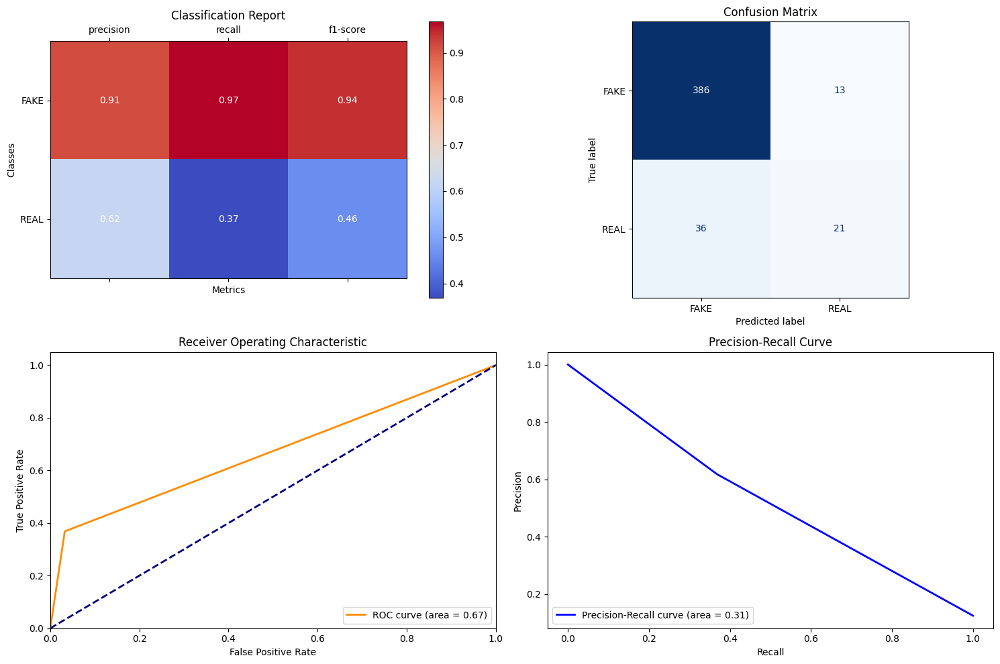

In [582]:
svm= SVC(probability=True)

# Train the model
svm.fit(X_resampled, y_resampled)

# Make predictions
y_pred = svm.predict(X_test_scaled)
generate_report(y_test,y_pred,test_df['original_sample'])


OBSERVATIONS: Based on the evaluation of the SVM model with oversamplin :

1. F1 Score Imbalance: The F1 score for the 'REAL' class is significantly lower (0.46) compared to the 'FAKE' class (0.94). This indicates that the model is much better at predicting 'FAKE' samples correctly than 'REAL' samples. The imbalance suggests that the model struggles with 'REAL' samples despite the oversampling technique intended to balance the class distribution.

2. ROC Curve Area: The ROC curve area is 0.67, which is relatively low. This value indicates that the model's overall ability to distinguish between the 'REAL' and 'FAKE' classes is moderate. A higher ROC curve area would indicate better performance, suggesting there is room for improvement in the model's discriminative power.

3. Precision-Recall Curve Area: The precision-recall curve area is 0.31, which is quite low. This score highlights that the model has difficulties in achieving a good trade-off between precision and recall, particularly for the minority class ('REAL'). It suggests that, even with oversampling, the model might be facing challenges with false positives and false negatives for 'REAL' samples.

4. Effectiveness of Oversampling: Although oversampling was used to address class imbalance, the results indicate that it was not sufficient to improve the model's performance for the 'REAL' class. The significant discrepancy in F1 scores and the low areas under the ROC and precision-recall curves suggest that further tuning or alternative techniques (such as different resampling strategies, feature engineering, or trying different model architectures) may be necessary to enhance the model's performance.

2. **Random Forest with Undersampling and Hyperparameter Tunning (Grid Search)**

In [541]:
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
rf = RandomForestClassifier()


**BEST PARAMETERS FOR RANDOM FOREST WITH UNDERSAMPLING**

In [555]:
# Random Forest
rf_grid = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=5, n_jobs=-1, verbose=2)
rf_grid.fit(X_undersampled, y_underesampled)
print(f"Best parameters for Random Forest: {rf_grid.best_params_}")

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=

[('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 1), ('margot-to-biden', 1), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-lin

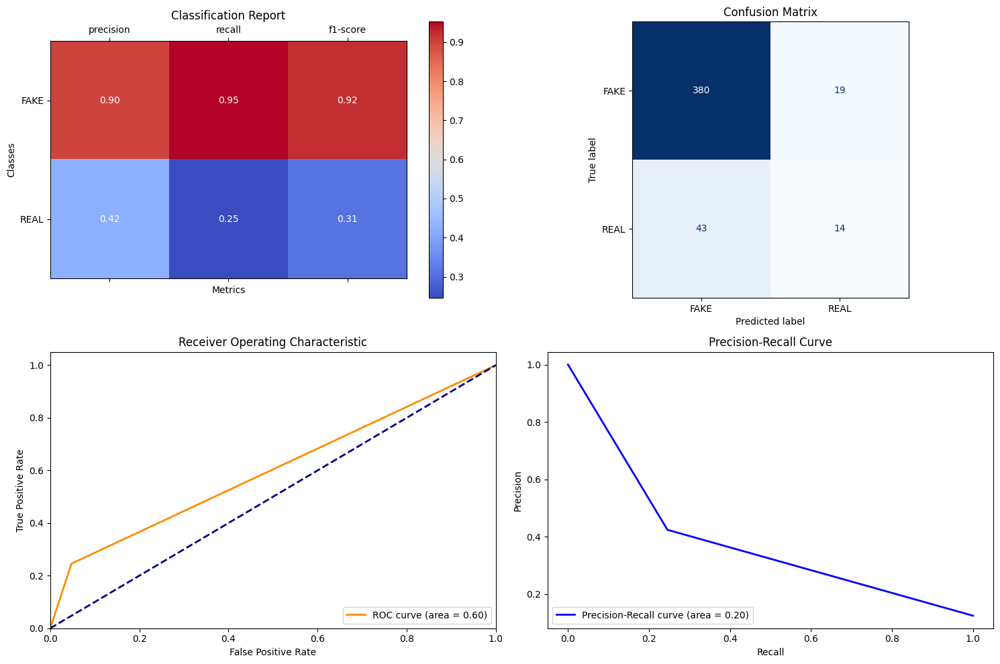

In [558]:
rf = RandomForestClassifier(max_depth= None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 5, n_estimators= 300)

# Train the model
rf.fit(X_undersampled, y_underesampled)

# Make predictions
y_pred =rf.predict(X_test_scaled)

generate_report(y_test,y_pred,test_df['original_sample'])

OBSERVATIONS: Based on the evaluation of the Random Forest model with undersampling and hyperparameter tuning (Grid Search):

1. F1 Score Disparity: The F1 score for the 'REAL' class is significantly low at 0.31, whereas the 'FAKE' class has a much higher F1 score of 0.92. This substantial disparity indicates that the model is performing well in predicting 'FAKE' samples but is inadequate in identifying 'REAL' samples accurately. The model is struggling to balance its performance between the two classes, even with the use of undersampling and hyperparameter tuning.

2. ROC Curve Area: The ROC curve area is 0.60, which is below the desirable threshold for a robust model. This score suggests that the model's overall capability to distinguish between 'REAL' and 'FAKE' samples is limited. The closer this value is to 1, the better the model is at differentiating between classes, so a score of 0.60 indicates mediocre performance.

3. Precision-Recall Curve Area: The precision-recall curve area is notably low at 0.20. This value reflects poor performance in terms of precision and recall, particularly for the 'REAL' class. A higher area under this curve would indicate a better balance between precision and recall, but in this case, the low value signals substantial challenges with false positives and false negatives.

4. Effectiveness of Undersampling and Hyperparameter Tuning: Despite employing undersampling to address class imbalance and using Grid Search for hyperparameter optimization, the model's performance for the 'REAL' class remains unsatisfactory. The substantial difference in F1 scores and low areas under the ROC and precision-recall curves suggest that these techniques have not sufficiently improved the model's ability to predict 'REAL' samples.


3. **XGBOOST with Undersampling and Hyperparameter Tunning(Randomized Search)**

In [559]:
from scipy.stats import randint, uniform

# Hyperparameter distributions
xgb_param_dist = {
    'n_estimators': randint(100, 300),
    'learning_rate': uniform(0.01, 0.19),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.8, 0.2),
    'colsample_bytree': uniform(0.8, 0.2)
}

knn_param_dist = {
    'n_neighbors': randint(1, 30),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}


In [560]:
xgb = XGBClassifier()
knn = KNeighborsClassifier()

**BEST PARAMETERS FOR XGBOOST WITH UNDERSAMPLING** 

In [561]:
xgb_random = RandomizedSearchCV(estimator=xgb, param_distributions=xgb_param_dist, n_iter=50, cv=5, n_jobs=-1, verbose=2, random_state=42)
xgb_random.fit(X_undersampled, y_underesampled)
print(f"Best parameters for XGBoost: {xgb_random.best_params_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=0.8749080237694725, learning_rate=0.19063571821788408, max_depth=5, n_estimators=171, subsample=0.9197316968394074; total time=   0.4s
[CV] END colsample_bytree=0.8749080237694725, learning_rate=0.19063571821788408, max_depth=5, n_estimators=171, subsample=0.9197316968394074; total time=   0.4s
[CV] END colsample_bytree=0.8749080237694725, learning_rate=0.19063571821788408, max_depth=5, n_estimators=171, subsample=0.9197316968394074; total time=   0.4s
[CV] END colsample_bytree=0.8749080237694725, learning_rate=0.19063571821788408, max_depth=5, n_estimators=171, subsample=0.9197316968394074; total time=   0.4s
[CV] END colsample_bytree=0.8749080237694725, learning_rate=0.19063571821788408, max_depth=5, n_estimators=171, subsample=0.9197316968394074; total time=   0.4s
[CV] END colsample_bytree=0.8312037280884873, learning_rate=0.039638958863878505, max_depth=5, n_estimators=187, subsample=0.86674172

[('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 1), ('margot-to-biden', 1), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-lin

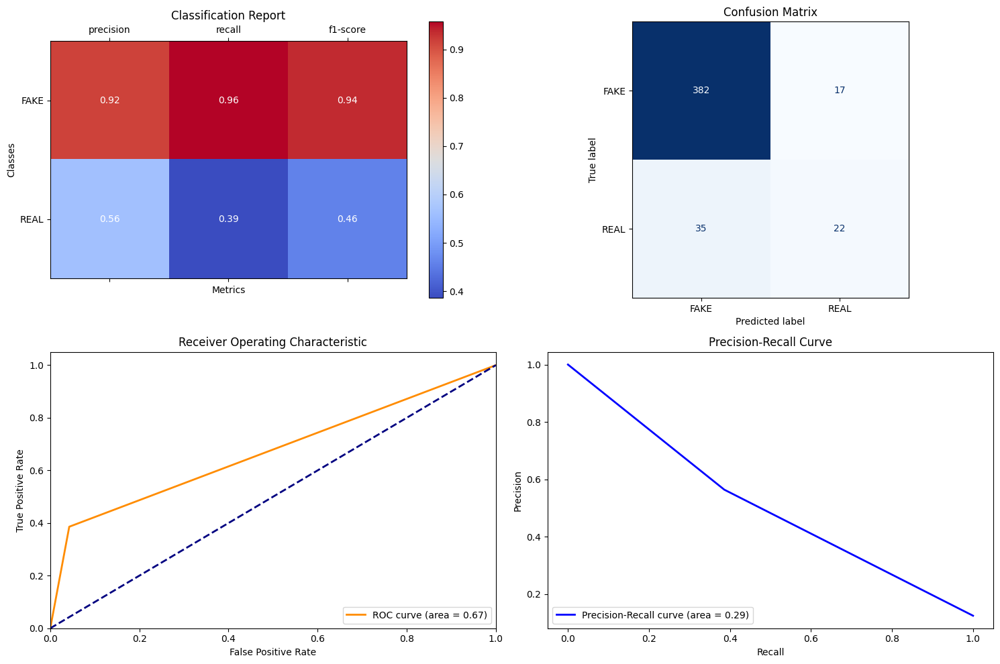

In [562]:
xgb = XGBClassifier(colsample_bytree= 0.8289789744182446, learning_rate= 0.10299602445273696, max_depth= 8, n_estimators= 259, subsample= 0.9185393447758787)

# Train the model
xgb.fit(X_undersampled, y_underesampled)

# Make predictions
y_pred = xgb.predict(X_test_scaled)

generate_report(y_test,y_pred,test_df['original_sample'])

OBSERVATIONS: Based on the evaluation of the XGBoost model with undersampling and hyperparameter tuning (Randomized Search):

1. F1 Score Disparity: The F1 score for the 'REAL' class is 0.46, while for the 'FAKE' class, it is significantly higher at 0.94. This disparity suggests that the model is effective in predicting 'FAKE' samples but struggles with accurately identifying 'REAL' samples. Despite the application of undersampling and hyperparameter tuning, the model has a considerable imbalance in its predictive performance.

2. ROC Curve Area: The ROC curve area is 0.67, which indicates moderate performance in distinguishing between 'REAL' and 'FAKE' samples. Although it is better than random guessing (which would yield an area of 0.5), it still falls short of the ideal area of 1. This suggests that there is room for improvement in the model's overall discriminative ability.

3. Precision-Recall Curve Area: The precision-recall curve area is relatively low at 0.29. This indicates that the model has challenges in maintaining high precision and recall, particularly for the 'REAL' class. A higher area under this curve would reflect a better balance between precision and recall, so a score of 0.29 highlights substantial difficulties with false positives and false negatives.

4. Effectiveness of Undersampling and Hyperparameter Tuning: Despite using undersampling to address class imbalance and Randomized Search for hyperparameter optimization, the model's performance for the 'REAL' class remains inadequate. The techniques have not sufficiently improved the model's ability to predict 'REAL' samples, as evidenced by the lower F1 score and precision-recall curve area for this class.

5. Comparative Analysis: When comparing these results with the previous Random Forest model, the XGBoost model shows a slightly better F1 score for the 'REAL' class but still demonstrates significant challenges in achieving balanced performance. Both models reveal the difficulty in predicting 'REAL' samples accurately, underscoring the need for further refinement in handling class imbalance.

4. **KNN with Undersampling and Hyperparameter Tunning(Randomized Search)**

**BEST PARAMETER FOR KNN WITH UNDERSAMPLING** 

In [563]:
knn_random = RandomizedSearchCV(estimator=knn, param_distributions=knn_param_dist, n_iter=50, cv=5, n_jobs=-1, verbose=2, random_state=42)
knn_random.fit(X_undersampled, y_underesampled)
print(f"Best parameters for KNN: {knn_random.best_params_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END .metric=minkowski, n_neighbors=11, weights=distance; total time=   0.0s
[CV] END .metric=minkowski, n_neighbors=11, weights=distance; total time=   0.0s
[CV] END .metric=minkowski, n_neighbors=11, weights=distance; total time=   0.0s
[CV] END ..metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END ..metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END ..metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END ..metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END ..metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END .metric=minkowski, n_neighbors=11, weights=distance; total time=   0.0s
[CV] END .metric=minkowski, n_neighbors=11, weights=distance; total time=   0.0s
[CV] END ..metric=euclidean, n_neighbors=21, weights=uniform; total time=   0.0s
[CV] END ..metric=euclidean, n_neighbors=21, we

[('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 1), ('margot-to-biden', 1), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-biden', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-linus', 0), ('margot-to-lin

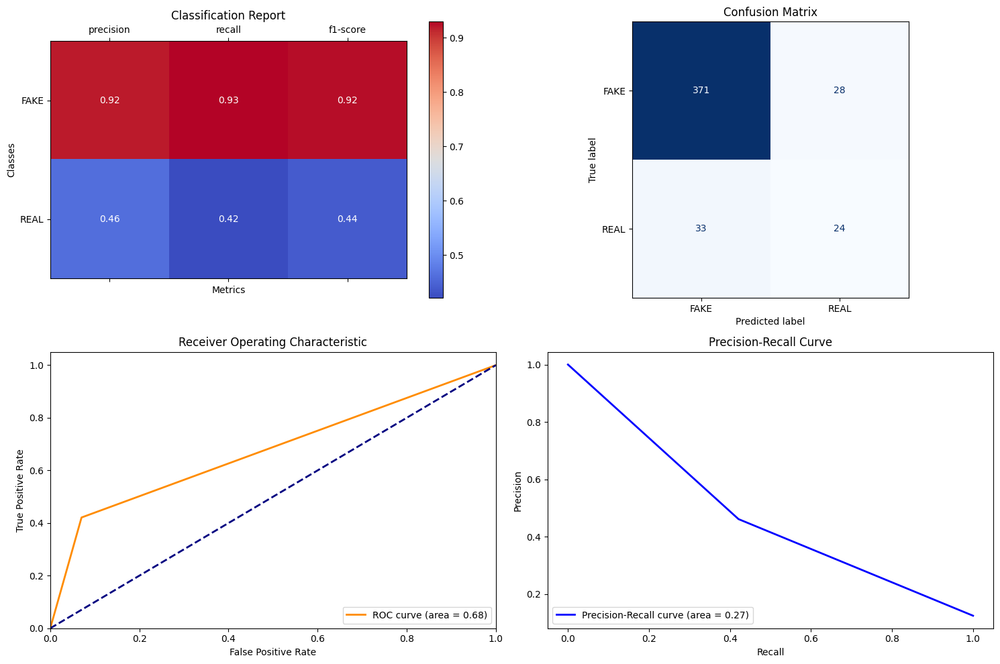

In [564]:
knn = KNeighborsClassifier(metric= 'manhattan', n_neighbors= 8, weights= 'distance')

# Train the model
knn.fit(X_undersampled, y_underesampled)

# Make predictions
y_pred = knn.predict(X_test_scaled)

generate_report(y_test,y_pred,test_df['original_sample'])

OBSERVATIONS: Based on the evaluation of the KNN model with undersampling and hyperparameter tuning (Randomized Search):

1. F1 Score Disparity: The F1 score for the 'REAL' class is 0.44, while for the 'FAKE' class, it is significantly higher at 0.92. This indicates that the model is more proficient at identifying 'FAKE' samples but struggles with accurately predicting 'REAL' samples. The disparity suggests an imbalance in predictive performance, despite the application of undersampling and hyperparameter tuning.

2. ROC Curve Area: The ROC curve area is 0.68, which indicates a moderate performance in distinguishing between 'REAL' and 'FAKE' samples. Although this is better than random guessing (an area of 0.5), it is still far from ideal (an area of 1). This suggests that there is room for improvement in the model's overall discriminative ability.

3. Precision-Recall Curve Area: The precision-recall curve area is relatively low at 0.27. This indicates that the model faces challenges in maintaining high precision and recall, especially for the 'REAL' class. A higher area under this curve would reflect a better balance between precision and recall, so a score of 0.27 highlights substantial difficulties with false positives and false negatives.

4. Effectiveness of Undersampling and Hyperparameter Tuning: Despite using undersampling to address class imbalance and Randomized Search for hyperparameter optimization, the model's performance for the 'REAL' class remains insufficient. The techniques have not significantly improved the model's ability to predict 'REAL' samples, as evidenced by the lower F1 score and precision-recall curve area for this class.

5. Comparative Analysis: Compared to the XGBoost model, the KNN model shows a slightly lower F1 score for the 'REAL' class but a similar high performance for the 'FAKE' class. The ROC curve area and precision-recall curve area are also comparable, indicating that both models face similar challenges in predicting 'REAL' samples accurately. This reinforces the need for further refinement in handling class imbalance

## Conclusion

Overall, SVM and XGBoost appear to be the most balanced models, offering a good trade-off between different evaluation metrics, whereas Random Forest struggles the most, especially in identifying 'REAL' samples accurately.